## 教訓のクラスタリングを行う

In [50]:
import pandas as pd
import numpy as np

df_out = pd.read_csv('../kadai_text_with_rating_kyokun_mini.csv')
embeddings = np.load('../embeddings.npy')

In [51]:
df_out["分野"].drop_duplicates().values

array(['運輸交通一般', '上水道', '環境問題', '道路', '教育', '保健・医療', '農業一般', '職業訓練', '港湾',
       '気象・地震', '農業機械', '水産', '行政一般', '財政・金融', '林業・森林保全', '人口・家族計画',
       '水資源開発', '農業土木', '都市衛生', '鉄道', '航空・空港', '電力', '放送', '工業一般', '下水道',
       '観光一般', '河川・砂防', '社会基盤一般', '陸運', '高等教育', '商業経営', '貿易', '鉱業', '畜産',
       '基礎教育', '中等教育', '情報・広報', 'エネルギー一般', '総合地域開発計画', '電気通信', '通信・放送一般',
       '海運・船舶', '家畜衛生', '上水道、下水道、都市衛生', '環境問題、河川・砂防', '総合地域開発計画、林業・森林保全',
       '養蚕', '上水道、下水道', '農業一般、農業土木', '開発計画一般', '公益事業一般', '人的資源一般', '基礎保健',
       '水産加工', 'その他', '都市計画・土地造成', '文化', '鉄道、都市交通', '観光施設',
       '畜産加工、工業一般、食品工業', '災害援助', '都市交通', '上水道、水資源開発', '社会福祉', '新・再生エネルギー',
       '行政一般、海運・船舶', '教育、災害援助', '測量・地図', '道路、都市交通', '環境問題、新・再生エネルギー',
       '環境問題、林業・森林保全', '河川・砂防、農業土木', '海運・船舶、電気通信', '下水道、港湾', '労働',
       '食糧増産援助', '保健・医療、社会福祉', '電気通信、電力', '人的資源一般、保健・医療', '電力、新・再生エネルギー',
       '上水道、河川・砂防', '環境問題、上水道、下水道', '高等教育、保健・医療', '通信・放送一般、基礎教育、中等教育',
       '道路、河川・砂防、災害援助', 'その他工業', '建築住宅', '運輸交通一般、保健・医療', '運輸交通一般、陸運'

In [52]:
df_out["region_detail"].drop_duplicates().values

array(['東アフリカ', '東南アジア', '東アジア', '西アフリカ', '中央アメリカ', '南アジア', '北アフリカ',
       '南ヨーロッパ', '南部アフリカ', 'ポリネシア', 'ミクロネシア', '中央アフリカ', '南アメリカ', '西アジア',
       '中央アジア', '東欧', 'メラネシア', 'カリブ海', nan, '北中米'], dtype=object)

In [53]:
#setting
K = 20  # kmeansのクラスタ数
_REP_NUM = 10  # 各クラスタの代表数
_PCA_DIM = 50  # PCAによる次元削減後の次元数
filter_category = None # None or list of categories to filter
filter_area = None#['東アフリカ'] # None or list of areas to filter
K_MIN = 10   # 下限は自分である程度決める
K_MAX = 60   # 上限も同様（計算コストと相談）
RANDOM_STATE = 42


In [54]:
## フィルタリング
if filter_category != None:
    mask = df_out["分野"].isin(filter_category)
    df_out = df_out[mask]

    # embeddings を同じ行だけ選ぶ
    embeddings = embeddings[mask.values]
else:
    pass

if filter_area != None:
    mask = df_out["region_detail"].isin(filter_area)
    df_out = df_out[mask]

    # embeddings を同じ行だけ選ぶ
    embeddings = embeddings[mask.values]
else:
    pass

## クラスタリング

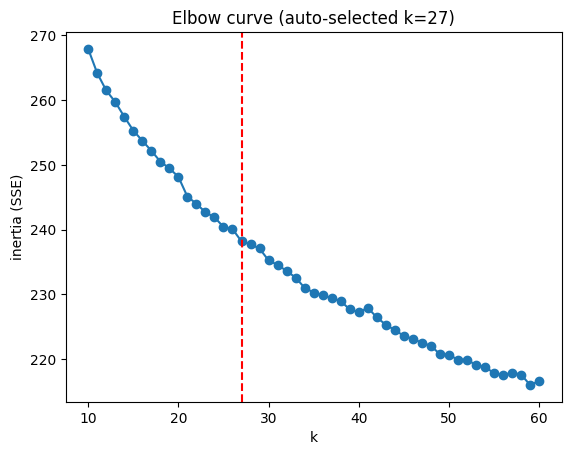

[INFO] Auto-selected K (elbow): 27
    cluster      n  bad_ratio  bad_ratio_weighted
2         2  223.0   0.427928            0.395959
14       14  145.0   0.435714            0.395565
22       22  184.0   0.350000            0.354445
18       18  221.0   0.347222            0.350975
3         3  227.0   0.330396            0.340374
8         8  192.0   0.297297            0.331050
13       13  152.0   0.296053            0.318147
24       24   66.0   0.184615            0.309308
21       21  247.0   0.334694            0.301116
26       26  214.0   0.375000            0.295930
12       12  169.0   0.309524            0.289858
9         9   97.0   0.288660            0.282670
6         6  250.0   0.244000            0.249140
23       23  246.0   0.260331            0.242416
11       11  109.0   0.212963            0.231025
20       20  112.0   0.223214            0.218529
7         7  160.0   0.175000            0.207998
16       16  152.0   0.233333            0.207505
10       10  17

/tmp/ipykernel_71671/2506019318.py:127: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(agg_cluster)


In [55]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==== 0. PCAで次元削減 ====
pca = PCA(n_components=_PCA_DIM, random_state=RANDOM_STATE)
X_reduced = pca.fit_transform(embeddings)   # embeddings: (N, D)

# ==== 1. エルボー法で K を自動選択 ====

def choose_k_elbow(X, k_min=5, k_max=50, random_state=42, plot=False):
    """
    KMeans の inertia を使ってエルボーを自動検出する。
    方法: (k_min, inertia_min) と (k_max, inertia_max) を結ぶ直線からの
          垂直距離が最大になる k を elbow とみなす。
    """
    ks = list(range(k_min, k_max + 1))
    inertias = []

    for k in ks:
        km = KMeans(n_clusters=k, random_state=random_state, n_init="auto")
        km.fit(X)
        inertias.append(km.inertia_)

    inertias = np.array(inertias, dtype=float)
    ks_arr = np.array(ks, dtype=float)

    # 両端の点
    x1, y1 = ks_arr[0], inertias[0]
    x2, y2 = ks_arr[-1], inertias[-1]

    # 直線ベクトル
    line_vec = np.array([x2 - x1, y2 - y1])
    line_vec /= np.linalg.norm(line_vec)  # 単位ベクトルに正規化

    # 各点に対して、直線への垂直距離を計算
    distances = []
    for k_val, inertia_val in zip(ks_arr, inertias):
        p = np.array([k_val - x1, inertia_val - y1])
        # p の直線方向成分
        proj_len = np.dot(p, line_vec)
        proj = proj_len * line_vec
        # 残差ベクトル = 垂直方向
        perp = p - proj
        distances.append(np.linalg.norm(perp))

    distances = np.array(distances)
    best_idx = np.argmax(distances)
    best_k = int(ks_arr[best_idx])

    if plot:
        fig, ax1 = plt.subplots()
        ax1.plot(ks, inertias, marker="o")
        ax1.set_xlabel("k")
        ax1.set_ylabel("inertia (SSE)")
        ax1.set_title("Elbow curve (auto-selected k={})".format(best_k))
        ax1.axvline(best_k, color="red", linestyle="--")
        plt.show()

    # 参考用に DataFrame も返す
    df_elbow = pd.DataFrame({
        "k": ks_arr.astype(int),
        "inertia": inertias,
        "distance": distances
    })

    return best_k, df_elbow

best_k, elbow_df = choose_k_elbow(
    X_reduced,
    k_min=K_MIN,
    k_max=K_MAX,
    random_state=RANDOM_STATE,
    plot=True  # プロットも見たければ True
)

print(f"[INFO] Auto-selected K (elbow): {best_k}")

# ==== 2. 選ばれた K で改めてクラスタリング ====
km = KMeans(n_clusters=best_k, random_state=RANDOM_STATE, n_init="auto")
cluster_labels = km.fit_predict(X_reduced)

df_out["cluster"] = cluster_labels

# ==== 3. 悪い評価フラグ ====
def is_bad(r):
    if pd.isna(r):
        return np.nan
    return 1 if r in [1.0, 2.0] else 0

df_out["bad_flag"] = df_out["total_eval"].apply(is_bad)

# ==== 4. ドキュメントごとの段落数 ====
doc_counts = df_out.groupby("project_id")["text"].size().to_dict()

# ==== 5. ドキュメント重み ====
df_out["doc_weight"] = df_out["project_id"].map(
    lambda pid: 1.0 / doc_counts.get(pid, 1)
)

# ==== 6. クラスタ別集計 ====
def agg_cluster(g: pd.DataFrame) -> pd.Series:
    n = len(g)
    bad_ratio = g["bad_flag"].mean()

    mask = g["bad_flag"].notna()
    if mask.any():
        bad_ratio_w = np.average(
            g.loc[mask, "bad_flag"],
            weights=g.loc[mask, "doc_weight"]
        )
    else:
        bad_ratio_w = np.nan

    return pd.Series({
        "n": n,
        "bad_ratio": bad_ratio,
        "bad_ratio_weighted": bad_ratio_w,
    })

cluster_stats = (
    df_out
    .groupby("cluster")
    .apply(agg_cluster)
    .reset_index()
    .sort_values("bad_ratio_weighted", ascending=False)
)

print(cluster_stats)

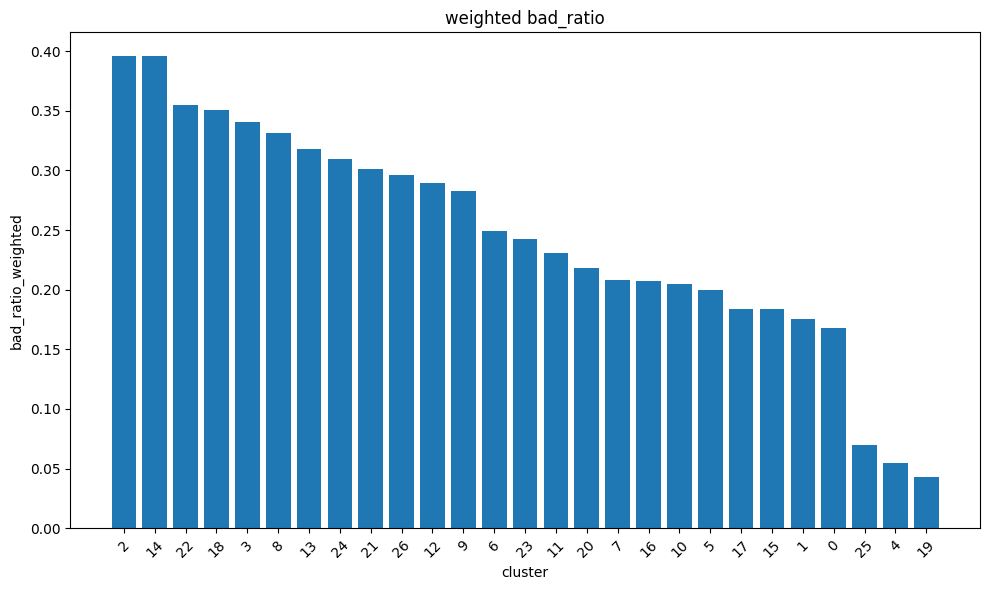

In [56]:
# =========================
# ここから図示パート
# =========================

# (A) クラスタ別 bad_ratio_weighted の棒グラフ
plt.figure(figsize=(10, 6))
# 並び替え済み cluster_stats をそのまま使う
x = cluster_stats["cluster"].astype(str)
y = cluster_stats["bad_ratio_weighted"]

plt.bar(x, y)
plt.xlabel("cluster")
plt.ylabel("bad_ratio_weighted")
plt.title("weighted bad_ratio")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


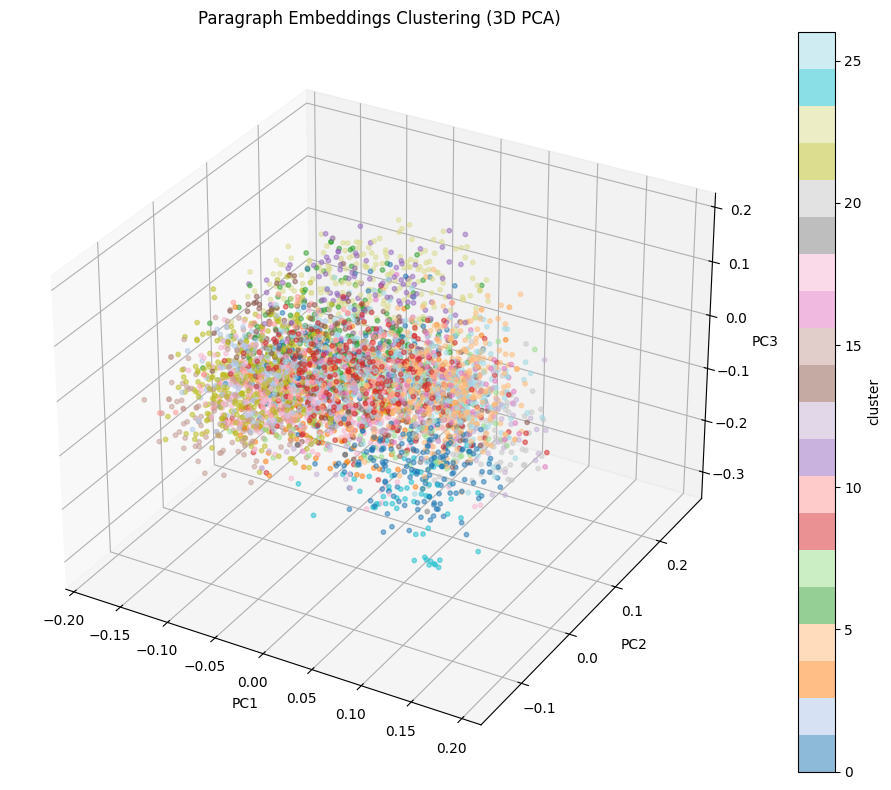

In [57]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D  # 3Dプロット用
import matplotlib.pyplot as plt

# --- 可視化用に3次元PCA ---
pca_3d = PCA(n_components=3, random_state=42)
X_3d = pca_3d.fit_transform(embeddings)

df_out["pc1"] = X_3d[:, 0]
df_out["pc2"] = X_3d[:, 1]
df_out["pc3"] = X_3d[:, 2]

# --- 3Dプロット ---
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

p = ax.scatter(
    df_out["pc1"],
    df_out["pc2"],
    df_out["pc3"],
    c=df_out["cluster"],
    cmap="tab20",
    alpha=0.5,
    s=10
)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("Paragraph Embeddings Clustering (3D PCA)")
fig.colorbar(p, ax=ax, label="cluster")

plt.tight_layout()
plt.show()

In [58]:
top_clusters = cluster_stats.sort_values("bad_ratio", ascending=False)["cluster"].tolist()

for c in top_clusters:
    print(f"\n=== Cluster {c} ===")
    subset = df_out[df_out["cluster"] == c].sample(min(5, len(df_out[df_out["cluster"] == c])), random_state=42)
    for t in subset["text"]:
        print("-", t.replace("\n", " "))


=== Cluster 14 ===
- そこで、実施機関は（利益相反には十分注意しつつ）職員を数年間民間企業に出向させる、あるいは、海外のビジネススクールに留学させるといった思い切った取り組みを行い、民間企業での経験やビジネス関連の知識を積んできた職員をSEZ／工業団地の運営・管理責任者に配置するといった対策が考えられる。そして同責任者に意思決定の権限を与え、現場での機動的な対応を組織的に後押しするための体制づくりが重要である。
- ただし、「タイミング」については、「紛争影響国・地域に留意した事後評価の視点」では、相手国政府の開発政策を検討する際に考慮すべき視点としてのみ書かれているが、本事業については、開発政策のみならず当時のイラクの情勢全般（特に治安状況）を踏まえたタイミングの適切さとして評価するのが適切だった。このように、事後評価においてどの視点をどのように用いるかは、「紛争影響国・地域に留意した事後評価の視点」上の分類を参照しつつも案件によって調整するほうがよい場合もあることがわかった。
- なお、ベトナムの場合、各省での井戸掘削案件の選定や予算措置を行う権限は、先方実施機関であるN-CERWASS やP-CERWASS ではなく省人民委員会が持つ。このため、基本設計の時点で省人民委員会も巻き込んで計画を策定することが必要と考えられる。
- また、援助事業は予算や支援期間が限られることから、相手国のオーナーシップを強化し、プロジェクトで開発した研修を維持・更新していくための明確な組織体制、予算配分、自助努力の確立に取り組むことが望まれる。後続プロジェクト6における「地方のニーズと社会の変革のための地方分権とリーダーシップに係るトップマネジメントセミナー」(2013)技術協力「地方行政法運用のための首都と州レベルの能力開発プロジェクト」(2010-2015)
- その理由として、実施機関と直系組織ではない地方自治政府機関であるコミューンに対して直接指示をする権限はコンサルタントにはないためである。本事業のように、事業実施中に組織改変があり、運営・維持管理を実施することになった直系組織ではない新たな機関に対し、人員配置や予算確保に向けた実施機関やコンサルタントからの助言が必要な場合、JICAはそれが実現できるよう、新たな運営・維持管理を行う機関に対し、二国

In [59]:
df_out.to_csv('../kadai_text_with_rating_and_clusters_kyokun_mini.csv', index=False, encoding='utf-8-sig')

In [60]:
import numpy as np
import pandas as pd

# embeddings: (N, D) の元ベクトル
# X_reduced: (N, pca_dim) の PCA 後ベクトル
# km.cluster_centers_: (K, pca_dim)

# 1. クラスタ中心からの距離を計算
centers = km.cluster_centers_   # shape (K, pca_dim)
df_out["cluster_dist"] = [
    np.linalg.norm(X_reduced[i] - centers[cluster_labels[i]])
    for i in range(len(df_out))
]

# 2. クラスタ内で距離順に並べる
df_out["cluster_rank"] = (
    df_out.groupby("cluster")["cluster_dist"]
    .rank(method="first")   # "first" は同距離でも順序を固定
)

# 3. クラスタごとに代表 N 個だけ取る
df_representative = (
    df_out
    .sort_values(["cluster", "cluster_dist"])
    .groupby("cluster")
    .head(_REP_NUM)
    .reset_index(drop=True)
)

print(df_representative[["cluster", "cluster_rank", "cluster_dist", "text"]].head(10))

   cluster  cluster_rank  cluster_dist  \
0        0           1.0      0.159710   
1        0           2.0      0.177854   
2        0           3.0      0.180339   
3        0           4.0      0.181035   
4        0           5.0      0.181353   
5        0           6.0      0.181541   
6        0           7.0      0.181853   
7        0           8.0      0.183374   
8        0           9.0      0.183703   
9        0          10.0      0.184180   

                                                text  
0  事業実施時に島外から業者を手配できたとしても、事業完了後に技能を有する業者が島内に留まらない...  
1  (1) 維持管理の体制構築独立後間もない国家では、施設の維持管理能力が低いことは予見可能であ...  
2  事業で整備された施設が定期的に維持管理される仕組み作り本事業においては瑕疵検査時に計画時に定...  
3  維持管理能力を向上にむけたソフトコンポーネントの活用本事業で建設したセコン橋はエクストラドー...  
4  カウンターパート/実施機関は、本事業で導入された設備を利用し、維持管理する能力が限られている...  
5  運営・維持管理資金確保のための政治的働きかけ本事業の審査時、過去の類似案件から事業完成後の運...  
6  （１）実施機関の維持管理能力向上に向けた継続的支援本事業では、事業実施中、JICA が長期・...  
7  このため、事後評価時の現地調査の対象4 町では、町・地方自治体の年間投資計画に道路の維持管理...  
8  事業完了後の維持管理を考慮した実施中の体制の設定本事業の対象区間は州道・県道と

In [61]:
import plotly.graph_objects as go
import pandas as pd

# 1. ホバー用に改行入りテキストを用意する関数
def wrap_for_hover(s: str, width: int = 40) -> str:
    if not isinstance(s, str):
        s = str(s)
    # N文字ごとに <br> を入れる（日本語でも機能する）
    return "<br>".join(s[i:i+width] for i in range(0, len(s), width))

# 2. DataFrame に hover_text 列を追加
df_representative["hover_text"] = df_representative["text"].apply(lambda x: wrap_for_hover(x, width=40))

# 3. 3次元散布図
fig = go.Figure(data=[go.Scatter3d(
    x=df_representative['pc1'],
    y=df_representative['pc2'],
    z=df_representative['pc3'],
    mode='markers',
    marker=dict(
        size=5,
        color=df_representative['pc1'],  # pc1の値で色分け
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title="pc1")
    ),
    # text に折り返し済みテキストを渡す
    text=df_representative['hover_text'],
    # %{text} に含まれる <br> がそのまま改行として解釈される
    hovertemplate='%{text}<extra></extra>'
)])

fig.update_layout(
    title='3次元主成分分析の可視化',
    scene=dict(
        xaxis_title='pc1',
        yaxis_title='pc2',
        zaxis_title='pc3'
    ),
    height=700,
    width=900,
    hoverlabel=dict(
        align='left'  # 左寄せの方が読みやすい
    )
)

fig.show()

In [62]:
df_representative.to_csv('../kadai_text_cluster_representatives_kyokun.csv', index=False, encoding='utf-8-sig')

In [80]:
df_representative[df_representative["cluster"] == 10]

,project_id,para_id,text,source,total_eval,eval_year,分野,region_detail,project_para_count,cluster,bad_flag,doc_weight,pc1,pc2,pc3,cluster_dist,cluster_rank,hover_text
100,2023_RW-C1_4_f.txt,1,さらに、本事業では、過去の開発政策借款からの教訓を踏まえて政策アドバイザー、技術協力プロジェ...,2023_RW-C1_4_f.pdf,NaN,2023,農業一般、基礎保健,東アフリカ,6,10,NaN,0.166667,0.000532,-0.109326,0.060310,0.171859,1.0,さらに、本事業では、過去の開発政策借款からの教訓を踏まえて政策アドバイザー、技術<br>協力...
101,2014_C02-P166_4_f.txt,1,実施段階でこのような調整による遅れを減らすには、計画段階からプロジェクトの実施機関に対し、円...,2014_C02-P166_4_f.pdf,3.0,2014,下水道,東アジア,3,10,0.0,0.333333,-0.042856,-0.036324,0.006738,0.174089,2.0,実施段階でこのような調整による遅れを減らすには、計画段階からプロジェクトの実施機<br>関に...
102,2021_MON-C5_4_f.txt,2,本事業でも当初計画されていた、貸付ごとに借款契約を調印し複数のフェーズに分けて貸付を行う（フ...,2021_MON-C5_4_f.pdf,NaN,2021,財政・金融,東アジア,3,10,NaN,0.333333,0.054645,-0.032903,0.090908,0.180033,3.0,本事業でも当初計画されていた、貸付ごとに借款契約を調印し複数のフェーズに分けて貸<br>付を...
103,2014_C03-P195_4_f.txt,4,また、そうしたリスクが審査時に明示されることによって、実際の成果に対して納得性の高い事後検証...,2014_C03-P195_4_f.pdf,3.0,2014,放送,東アジア,6,10,0.0,0.166667,-0.019018,-0.070325,0.010537,0.180858,4.0,また、そうしたリスクが審査時に明示されることによって、実際の成果に対して納得性の<br>高い...
104,2020_BD-P67_4_f.txt,2,PFI による自由な金利設定金融機関は十分な収益を確保できないこともあり小規模な金額の融資を...,2020_BD-P67_4_f.pdf,4.0,2020,財政・金融,南アジア,4,10,0.0,0.250000,0.019977,-0.041222,-0.012481,0.181580,5.0,PFI による自由な金利設定金融機関は十分な収益を確保できないこともあり小規模な<br>金額...
105,2018_PH-P245_4_f.txt,0,中間レビューによる課題の分析と対応策の検討本事業の実施期間は7 年間と長く、実施期間中に金利...,2018_PH-P245_4_f.pdf,3.0,2018,運輸交通一般,東南アジア,4,10,0.0,0.250000,0.006400,-0.109375,0.008566,0.181994,6.0,中間レビューによる課題の分析と対応策の検討本事業の実施期間は7 年間と長く、実施<br>期間...
106,2016_VNXI-4_4_f.txt,0,借款事業スコープの適切な管理バリア・ブンタウ省から事業キャンセルにかかる通知がないが、JIC...,2016_VNXI-4_4_f.pdf,2.0,2016,上水道,東南アジア,1,10,1.0,1.000000,-0.074624,-0.064083,0.001973,0.182205,7.0,借款事業スコープの適切な管理バリア・ブンタウ省から事業キャンセルにかかる通知がな<br>いが...
107,2021_ID-C9_4_f.txt,1,今後の類似案件においても、政策マトリックスを作成する際には、産業界からのニーズも踏まえた上で...,2021_ID-C9_4_f.pdf,NaN,2021,開発計画一般,南アジア,4,10,NaN,0.250000,0.005734,-0.021985,0.066386,0.182435,8.0,今後の類似案件においても、政策マトリックスを作成する際には、産業界からのニーズも<br>踏ま...
108,2022_ID-P236_4_f.txt,0,（１）類似案件や先行案件の教訓を踏まえた案件形成の重要性過去の類似案件および先行案件の教訓を...,2022_ID-P236_4_f.pdf,4.0,2022,新・再生エネルギー,南アジア,3,10,0.0,0.333333,0.031720,-0.022926,0.071239,0.182778,9.0,（１）類似案件や先行案件の教訓を踏まえた案件形成の重要性過去の類似案件および先行<br>案件...
109,2019_VN-C20_4_f.txt,4,そのため、政策改革支援を伴う借款では、関係省庁の政策策定者に近いポジションへの長期専門家派遣...,2019_VN-C20_4_f.pdf,NaN,2019,環境問題,東南アジア,8,10,NaN,0.125000,-0.005765,-0.072561,0.055507,0.184917,10.0,そのため、政策改革支援を伴う借款では、関係省庁の政策策定者に近いポジションへの長<br>期専...


In [82]:
df_representative[df_representative["cluster_rank"] < 5][["hover_text","cluster"]]

,hover_text,cluster
0,事業実施時に島外から業者を手配できたとしても、事業完了後に技能を有する業者が島内<br>に留...,0
1,(1) 維持管理の体制構築独立後間もない国家では、施設の維持管理能力が低いことは<br>予見...,0
2,事業で整備された施設が定期的に維持管理される仕組み作り本事業においては瑕疵検査時<br>に計...,0
3,維持管理能力を向上にむけたソフトコンポーネントの活用本事業で建設したセコン橋はエ<br>クス...,0
10,また、一村一品事業の推進については、第4回アフリカ開発会議（TICADIV）横浜<br>行動...,1
...,...,...
253,洪水制御・水資源管理事業におけるIECプログラム導入の重要性：実施機関は、今後、<br>洪水...,25
260,（１）ステアリングコミッティの設置による関係省庁、州政府の巻き込み開発計画調査型<br>技術...,26
261,こうした経緯を踏まえ、類似案件の実施においては、相手側のキャパシティを見極めた上<br>で、...,26
262,本事業には、制度・法規・組織の整備が含まれていたが、財政に関しては、再開発資金の<br>設立...,26


: 